### Here is an example of the full pipeline I have set up for creating scenes -> radio map. This is running on sionna 0.19.0, mitsuba 3.5.2, and tensorflow 2.15.1 (tf should be able to be upgraded to a more current version, but sionna and mitsuba shouldn't be until sionna supports diffraction)

First get imports done, scene creator is a local file, lunar_terrain_generator can be installed following instructions here: https://github.com/anderspearson206/LunarTerrainGenerator

In [1]:
import os # Configure which GPU
if os.getenv("CUDA_VISIBLE_DEVICES") is None:
    gpu_num = 0 # Use "" to use the CPU
    os.environ["CUDA_VISIBLE_DEVICES"] = f"{gpu_num}"
os.environ['TF_CPP_MIN_LOG_LEVEL'] = '3'

# Import Sionna
try:
    import sionna
except ImportError as e:
    # Install Sionna if package is not already installed
    import os
    os.system("pip install sionna==0.19.0")
    import sionna

# Configure the notebook to use only a single GPU and allocate only as much memory as needed
# For more details, see https://www.tensorflow.org/guide/gpu
import tensorflow as tf
gpus = tf.config.list_physical_devices('GPU')
if gpus:
    try:
        tf.config.experimental.set_memory_growth(gpus[0], True)
    except RuntimeError as e:
        print(e)

# Avoid warnings from TensorFlow
tf.get_logger().setLevel('ERROR')

# Colab does currently not support the latest version of ipython.
# Thus, the preview does not work in Colab. However, whenever possible we
# strongly recommend to use the scene preview mode.
try: # detect if the notebook runs in Colab
    import google.colab
    no_preview = True # deactivate preview
except:
    if os.getenv("SIONNA_NO_PREVIEW"):
        no_preview = True
    else:
        no_preview = False

resolution = [480,320] # increase for higher quality of renderings

# Define magic cell command to skip a cell if needed
from IPython.core.magic import register_cell_magic
from IPython import get_ipython

@register_cell_magic
def skip_if(line, cell):
    if eval(line):
        return
    get_ipython().run_cell(cell)

# Set random seed for reproducibility
sionna.config.seed = 42

# Other imports
%matplotlib inline
import matplotlib as mpl
import matplotlib.pyplot as plt
from matplotlib import colormaps
import numpy as np
import sys
import time
from rich.progress import track
import scene_creator as sce # local file based on pydelatin
from lunar_terrain_generator import LTGen 
from scipy.ndimage import gaussian_filter
import cv2

from sionna.rt import load_scene, PlanarArray, Transmitter, Receiver, Camera, watt_to_dbm
from sionna.mimo.precoding import normalize_precoding_power, grid_of_beams_dft
from sionna.channel import cir_to_ofdm_channel, subcarrier_frequencies

#### Next generate the heightmap and scene using the lunar terrain generator library and the helper library.

PRECOMPUTING CRATER PROFILES (MEMORY SAVER)


100%|██████████| 7990/7990 [01:06<00:00, 120.85it/s]


GENERATING HIGHLAND TERRAIN


<Figure size 640x480 with 0 Axes>

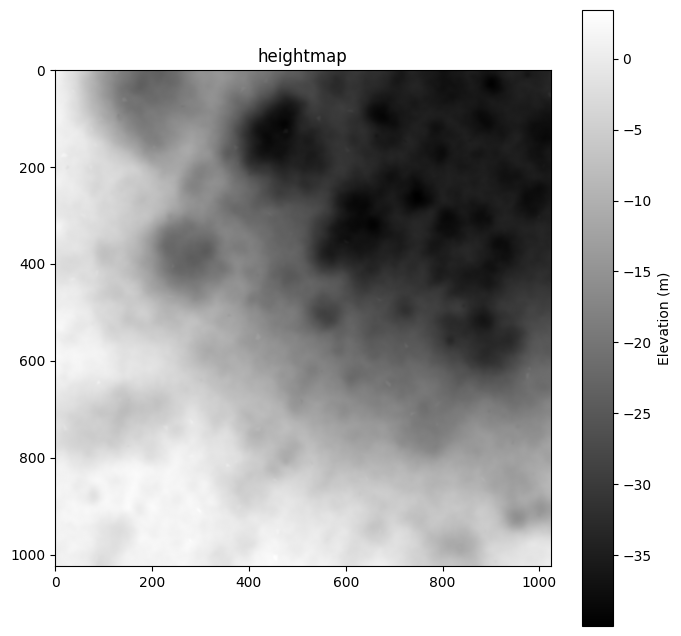

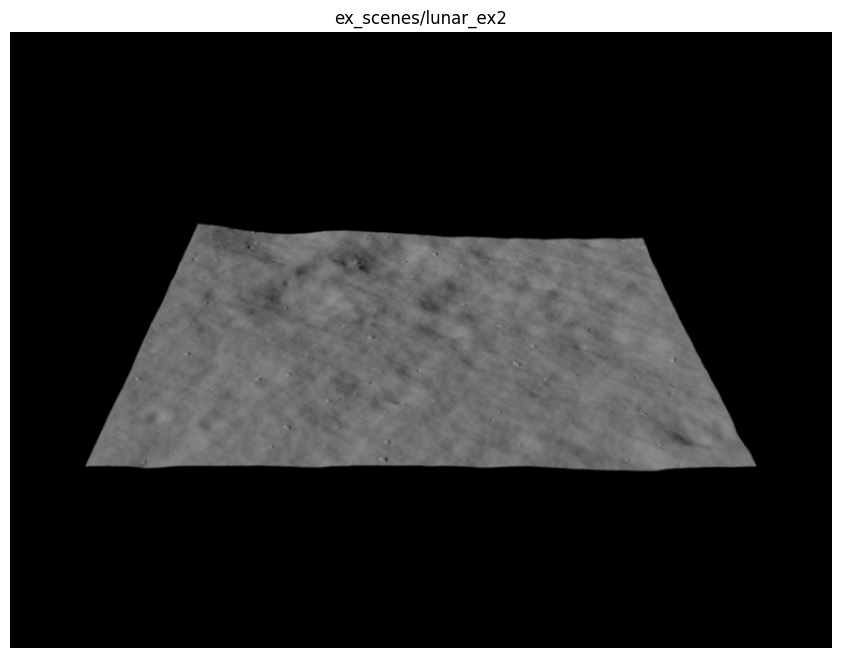

Scene saved to ex_scenes/lunar_ex2_scene.xml


In [ ]:

mygenerator = LTGen()

your_data_folder = 'ex_scenes'

try: 
    example_terrain1 = np.load(f'{your_data_folder}/lunar_ex2.npy')
    mygenerator.display_DTM(example_terrain1)
except Exception as e:
    mygenerator.generate_crater_dict(low_memory=True) #this step might take a second
    example_terrain1 = mygenerator.gen_highland()
    mygenerator.display_DTM(example_terrain1)
    np.save(f'{your_data_folder}/lunar_ex2.npy', example_terrain1)
    sce.save_scene(example_terrain1, filename=f'{your_data_folder}/lunar_ex2', detail=0.01, base=False)

    

In [3]:
# normalize the heightmap height, this will help us to place tx's and rx's later
example_terrain = np.copy(example_terrain1) - np.min(example_terrain1)

In [ ]:
mat_lunar_regolith = sionna.rt.RadioMaterial(
    name="lunar-regolith",
    relative_permittivity=2.7,
    conductivity=1.87e-3,
    scattering_coefficient=0.632,
    xpd_coefficient=0.1,
    scattering_pattern=LambertianPattern(), # defaults to lambertian
    frequency_update_callback=None)

In [ ]:
# Load the scene in, tx and rx array are just the array in the sionna example docs
try:
    scene = load_scene(f'{your_data_folder}/lunar_ex2_scene.xml')
except Exception as e:
    sce.save_scene(example_terrain, filename=f'{your_data_folder}/lunar_ex2')
    scene = load_scene('f{your_data_folder}/lunar_ex2_scene.xml')
    
scene.frequency = 3e9 # Carrier frequency [Hz]
scene.tx_array = PlanarArray(1,1,0.5,0.5,"iso", "V")
scene.rx_array = PlanarArray(1,1,0.5,0.5,"iso", "V")
scene.add(mat_lunar_regolith)

surface = scene.get("ground")
surface.radio_material = "lunar-regolith"

z = example_terrain[512,512] # center of heightmap z val
tx = Transmitter("tx", position=[0,0,z+5], look_at=[0,0,0], power_dbm=20)
scene.add(tx)

# this defines our radiomap params

cell_size = (32,32) # defines cell size for cmap // Resolution of radio map
total_size = 512 # size of c-map

center = [0,0,z+1] # defines center of cmap
total_num_cmap_cells = (total_size//cell_size[0])^2
total_num_rx = total_num_cmap_cells

26.54326629638672


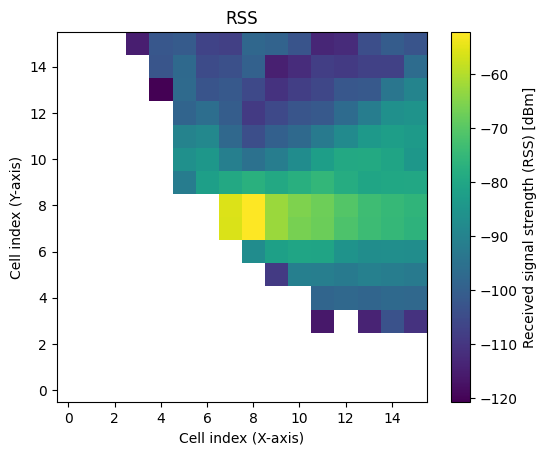

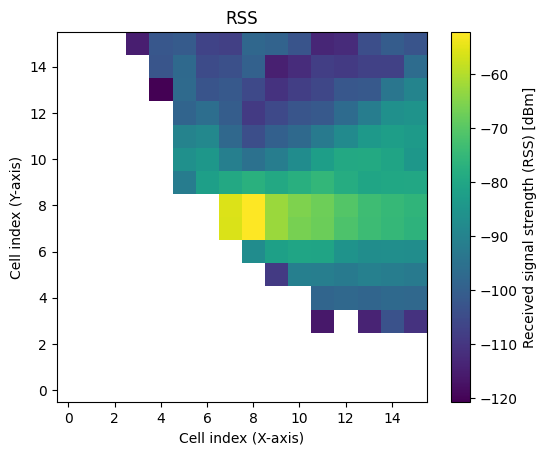

In [6]:
# I like to compute the coverage map just to check if it works, it also
# gives us a cm.cell_centers value that I have been lazily using to place my rx's 
# this should probably be computed elsewhere so we don't have to compute a cmap always 
#  to get the raytraced version
start = time.time()

cm = scene.coverage_map(max_depth=5,           # Maximum number of ray scene interactions
                        num_samples=int(10e6), # If you increase: less noise, but more memory required
                        cm_cell_size=cell_size,   # Resolution of the coverage map
                        cm_center=center,   # Center of the coverage map
                        cm_size=[total_size, total_size],    # Total size of the coverage map
                        cm_orientation=[0, 0, 0], # Orientation of the coverage map, e.g., could be also vertical
                        diffraction=False,
                        scattering=False, 
                        reflection = True)
print(time.time() - start)
cm.show(metric = 'rss', show_tx=False)

In [10]:
# here is my lazy way to get cell_centers
cell_centers2 = cm.cell_centers.numpy()

#### the next parts are how I have been computing the non-planar radio maps through hard coded raytracing. One important note is this can be very memory/time intensive. If the map is small, it is okay to place all the recievers at once, and then compute all the paths at once (this is faster). But as the map gets large/more detailed you need to split up the path computations (in my experience with larger maps you don't want to compute paths for more than 32 rxs at once, on my laptop or running on gpu in the cloud this has remained a rough limit). 

In [ ]:
# RAY TRACING TOTAL PROCESS
# THIS CELL PLACES ALL THE RX's DOWN AND VISUALIZES, DOES NOT COMPUTE PATHS YET
# but it does help you visualize where your tx and rx's 

[scene.remove(rx.name) for rx in scene.receivers.values()]  # remove existing receivers before time start
start = time.time()

# Default parameters in the PUSCHConfig
subcarrier_spacing = 15e3
fft_size = 48

def place_receivers(scene, cell_centers):
  # place recievers in each cell
  for i in range(cell_centers.shape[0]):
      for j in range(cell_centers.shape[1]):
          cell_center = cell_centers[i, j, :]
          z = example_terrain[int(512-cell_center[1]), int(512+cell_center[0])]

          cell_center[2] = z+1.5

          rx = Receiver(name=f"rx_{i}_{j}", position=cell_center.tolist()) 
          scene.add(rx)  



def get_rss_from_csi(csi):
  # compute csi power
  csi_power = tf.abs(csi)**2

  # compute rss per receiver-transmitter pair (sum over subcarriers)
  rss_per_rx_tx = tf.reduce_sum(csi_power, axis=-1)  

  # convert rss to dBm
  rss_per_rx_tx_dBm = 10 * tf.math.log(rss_per_rx_tx / 1e-3) / tf.math.log(10.0) 

  return rss_per_rx_tx_dBm

start = time.time()
cell_centers = cm.cell_centers.numpy()

place_receivers(scene, cell_centers)
scene.preview(background='#000000')
# del cm


Renderer(camera=PerspectiveCamera(aspect=1.31, children=(DirectionalLight(intensity=0.25, matrixWorldNeedsUpda…

#### Below there are two ways I have designed to get the coverage map. The one commented out places rx's row by row, computing the paths each time and deleting the rx's afterwards. the next one does something similar but splits up the rows into parts as well. This is necessary when computing maps bigger than 32x32 in my experience.

Output()

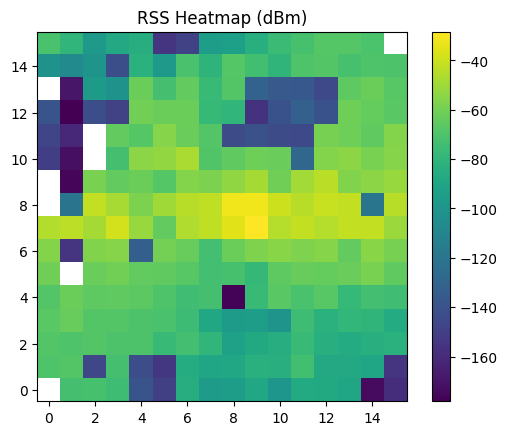

267.7306396961212


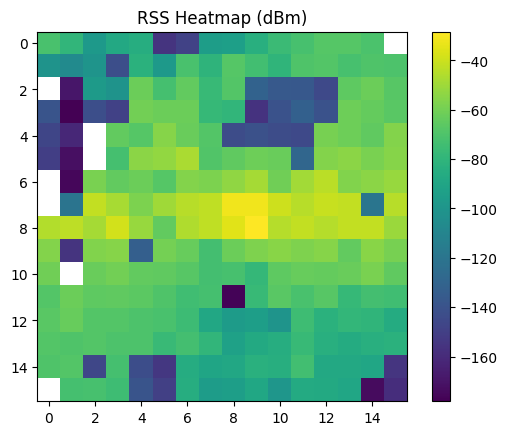

In [12]:
# Default parameters in the PUSCHConfig
subcarrier_spacing = 15e3
fft_size = 48
cell_centers = cell_centers2
rss_list = []

start = time.time()
[scene.remove(rx.name) for rx in scene.receivers.values()] 

# COMPUTE CMAP ROW BY ROW, DOESN'T SPLIT ROWS INTO PARTS
if False:
    for i in track(range(cell_centers.shape[0]), description="Progress"):
        for j in range(cell_centers.shape[1]):
            cell_center = cell_centers[i, j, :]
            z = example_terrain[int(512-cell_center[1]), int(512+cell_center[0])]
            # print('initital cell center:', cell_center)
            cell_center[2] = z+1

            rx_name = f"rx_{i}_{j}"
            rx = Receiver(name=rx_name, position=cell_center.tolist()) 
            scene.add(rx)

        paths = scene.compute_paths(max_depth=5, diffraction=True, scattering=True)

        # CIR
        a, tau = paths.cir()

        frequencies = subcarrier_frequencies(fft_size, subcarrier_spacing)

        csi = cir_to_ofdm_channel(frequencies, a, tau, normalize=False)  

        rss = get_rss_from_csi(csi).numpy()[0, :, 0, 0, 0, 0]

        rss_list.append(rss)

        [scene.remove(rx.name) for rx in scene.receivers.values()]

# COMPUTES CMAP BY ROW, AND SPLITS ROWS INTO PARTS
for i in track(range(cell_centers.shape[0]), description="Progress"):
    splits = 4
    num_j = cell_centers.shape[1]
    part_j = num_j // 4

    for part in range(splits):  
        start_j = part * part_j
        end_j = (part + 1) * part_j if part < 3 else num_j 

        # place part of the recievers 
        for j in range(start_j, end_j):
            cell_center = cell_centers[i, j, :]
            z = example_terrain[int(512 - cell_center[1]), int(512 + cell_center[0])]
            cell_center[2] = z + 1

            rx_name = f"rx_{i}_{j}"
            rx = Receiver(name=rx_name, position=cell_center.tolist())
            scene.add(rx)

        # compute paths 
        paths = scene.compute_paths(max_depth=5, diffraction=True, scattering=True)
        
        a, tau = paths.cir()
        frequencies = subcarrier_frequencies(fft_size, subcarrier_spacing)
        csi = cir_to_ofdm_channel(frequencies, a, tau, normalize=False)
        rss = get_rss_from_csi(csi).numpy()[0, :, 0, 0, 0, 0]

        rss_list.append(rss)
        # print('new rss shape: ', rss_list.shape)
        # np.save('rss_np.npy', np.array(rss_list))
        # np.save('rss_index.npy', np.array([i, part, j]))
        
        del paths, frequencies, csi, rss
        
        for rx in list(scene.receivers.values()):
            scene.remove(rx.name)
            
    # optionally print the map so far to see if progress is correct
    # just change the mod value
    if (i+1)%16 == 0:
        temp = np.copy(np.array(rss_list)).reshape(i+1, cell_centers.shape[1])
        plt.imshow(temp, cmap='viridis', interpolation='nearest')
        plt.colorbar()
        plt.title("RSS Heatmap (dBm)")
        plt.gca().invert_yaxis()
        plt.show()
        del temp

# The rss list needs to be reshaped after it's computed to show correctly 
rss_array = np.array(rss_list).reshape(cell_centers.shape[0], cell_centers.shape[1])[::-1, :]

print(time.time() - start)

plt.imshow(rss_array, cmap='viridis', interpolation='nearest')
plt.colorbar()
plt.title("RSS Heatmap (dBm)")

plt.show()

#### The rest of this is just visualization and comparison to the heightmap

<Figure size 640x480 with 0 Axes>

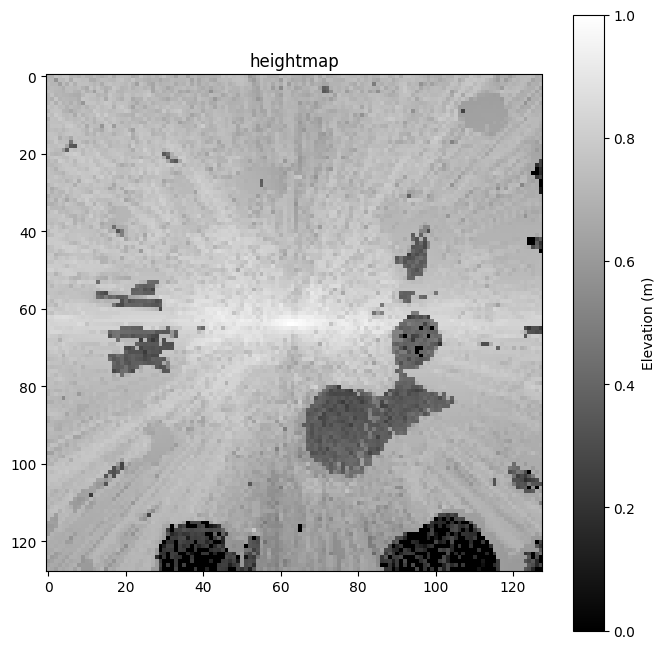

<Figure size 640x480 with 0 Axes>

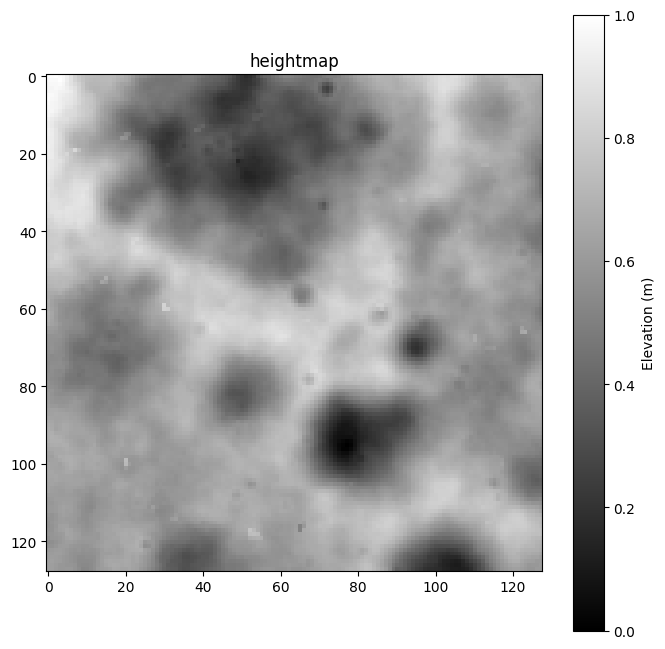

<Figure size 640x480 with 0 Axes>

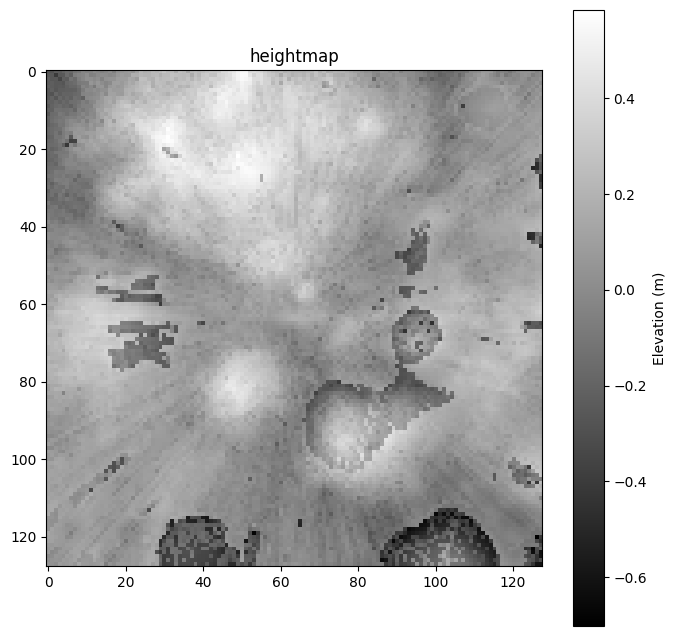

<module 'matplotlib.pyplot' from 'c:\\Users\\Anders\\Documents\\NASA_DCGR\\nasa_venv\\Lib\\site-packages\\matplotlib\\pyplot.py'>

In [ ]:
terr = np.copy(example_terrain[512-total_size//2:512+total_size//2, 512-total_size//2:512+total_size//2])
filt = terr - gaussian_filter(terr, 60)
down_sampled_filt = cv2.resize(filt, [int(total_size//cell_size[0]), int(total_size//cell_size[0])], interpolation=cv2.INTER_LINEAR)
down_sampled = cv2.resize(terr, [int(total_size//cell_size[0]), int(total_size//cell_size[0])], interpolation=cv2.INTER_LINEAR)
rss_array2 = np.clip(np.copy(rss_array), -190, 0)
rss_array_norm = rss_array2-np.min(rss_array2)
rss_array_norm = rss_array_norm/np.max(rss_array_norm)
down_sampled_norm = down_sampled_filt - np.min(down_sampled_filt)
down_sampled_norm = down_sampled_norm/np.max(down_sampled_norm)


mygenerator.display_DTM(rss_array_norm)
mygenerator.display_DTM(down_sampled_norm)
mygenerator.display_DTM(rss_array_norm-down_sampled_norm)

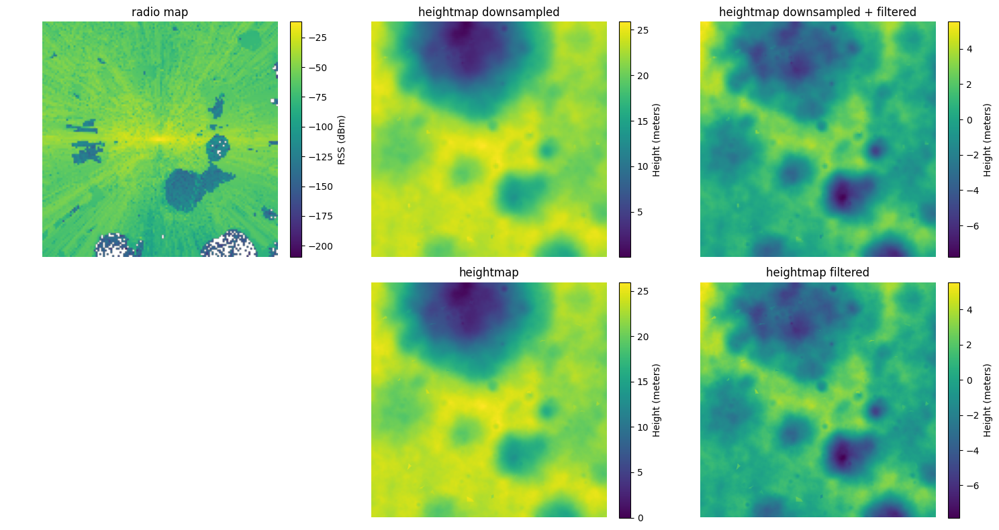

In [ ]:

images = {
    (0, 0): (rss_array, 'radio map', 'RSS (dBm)'),
    (0, 1): (down_sampled, 'heightmap downsampled', 'Height (meters)'),
    (0, 2): (down_sampled_filt, 'heightmap downsampled + filtered', 'Height (meters)'),
    (1, 1): (terr, 'heightmap', 'Height (meters)'),
    (1, 2): (filt, 'heightmap filtered', 'Height (meters)')
}


fig, axes = plt.subplots(2, 3, figsize=(15, 8))

for (i, j), (img, title, colorbar_label) in images.items():
    ax = axes[i, j]
    im = ax.imshow(img, cmap='viridis')
    ax.set_title(title)
    ax.axis('off')

    cbar = fig.colorbar(im, ax=ax, fraction=0.046, pad=0.04)
    cbar.set_label(colorbar_label)


axes[1, 0].axis('off')

plt.tight_layout()
plt.show()
